# Импорт библиотек и загрузка данных

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [2]:
url = 'https://drive.google.com/file/d/1kVrYF25Tq6WUexjhUuO82wx-gbhnvyEx/view?usp=sharing'
url = 'https://drive.google.com/uc?id=' + url.split('/')[-2]
df = pd.read_csv(url)

In [3]:
df.sample(5)

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
207141,0.0,0.0,0.0,1.0,28.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,13.0,5.0,5.0
75308,0.0,0.0,1.0,0.0,29.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,5.0,0.0,0.0,0.0,7.0,5.0,7.0
61008,0.0,0.0,0.0,1.0,21.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,1.0,3.0,4.0,0.0,0.0,7.0,6.0,5.0
155836,1.0,1.0,0.0,1.0,31.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,4.0,0.0,0.0,1.0,0.0,8.0,5.0,5.0
221559,1.0,0.0,1.0,1.0,32.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,5.0,30.0,30.0,1.0,0.0,10.0,4.0,1.0


In [ ]:
df['Diabetes_binary'].nunique()

2

Целевая переменная - Diabetes_binary. Она бинарная.

# EDA

In [ ]:
df.isnull().sum().sum()

np.int64(0)

В датасете не имеется пустых данных.

In [ ]:
df.describe()

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
count,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,...,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000
mean,0.139333,0.429001,0.424121,0.962670,28.382364,0.443169,0.040571,0.094186,0.756544,0.634256,...,0.951053,0.084177,2.511392,3.184772,4.242081,0.168224,0.440342,8.032119,5.050434,6.053875
std,0.346294,0.494934,0.494210,0.189571,6.608694,0.496761,0.197294,0.292087,0.429169,0.481639,...,0.215759,0.277654,1.068477,7.412847,8.717951,0.374066,0.496429,3.054220,0.985774,2.071148
min,0.000000,0.000000,0.000000,0.000000,12.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000
25%,0.000000,0.000000,0.000000,1.000000,24.000000,0.000000,0.000000,0.000000,1.000000,0.000000,...,1.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,6.000000,4.000000,5.000000
50%,0.000000,0.000000,0.000000,1.000000,27.000000,0.000000,0.000000,0.000000,1.000000,1.000000,...,1.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,8.000000,5.000000,7.000000
75%,0.000000,1.000000,1.000000,1.000000,31.000000,1.000000,0.000000,0.000000,1.000000,1.000000,...,1.000000,0.000000,3.000000,2.000000,3.000000,0.000000,1.000000,10.000000,6.000000,8.000000
max,1.000000,1.000000,1.000000,1.000000,98.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,5.000000,30.000000,30.000000,1.000000,1.000000,13.000000,6.000000,8.000000


In [ ]:
df.duplicated().sum()

np.int64(24206)

У нас имеется довольно много дубликатов, уберем их

In [ ]:
df.drop_duplicates(inplace=True)

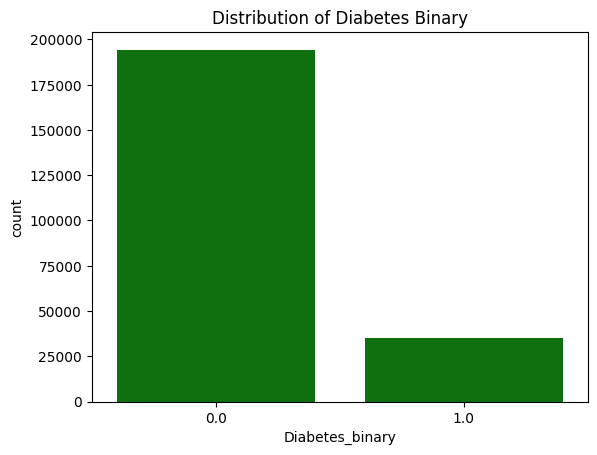

In [ ]:
sns.countplot(x='Diabetes_binary', data=df, color='green')
plt.title('Distribution of Diabetes Binary')
plt.show()

Видим, что классы не сбалансированны.

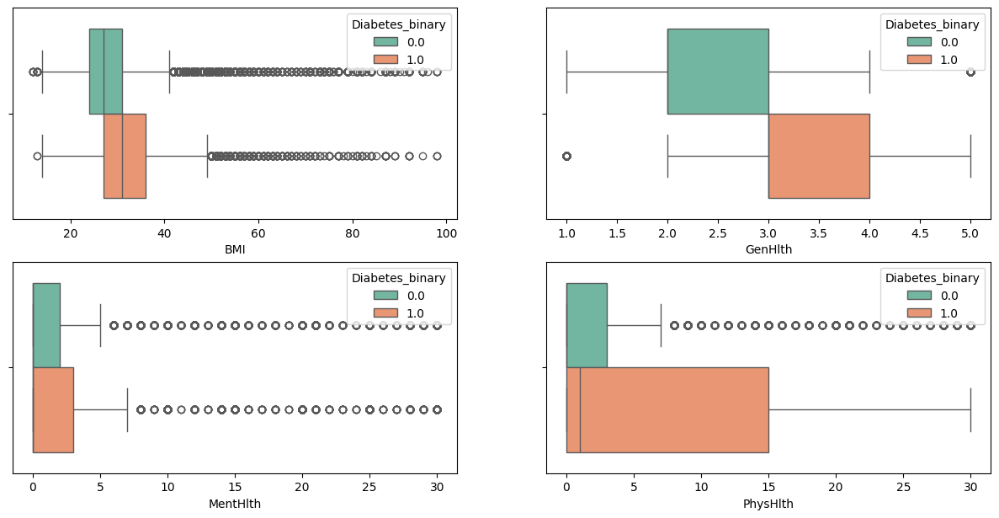

In [ ]:
plt.figure(figsize=(15, 15))
for i,col in enumerate(['BMI', 'GenHlth', 'MentHlth', 'PhysHlth']):
    plt.subplot(4, 2, i + 1)
    sns.boxplot(x=col, data=df, hue='Diabetes_binary', palette='Set2')
plt.show()

В 3х из 4х случаев выбросов не имеется, но вот в BMI они есть. Но убирать мы из не будем, так как они отражают реальные данные, ведь люди с большим BMI сущетсвуют и это может как-то влиять на вывод модели.

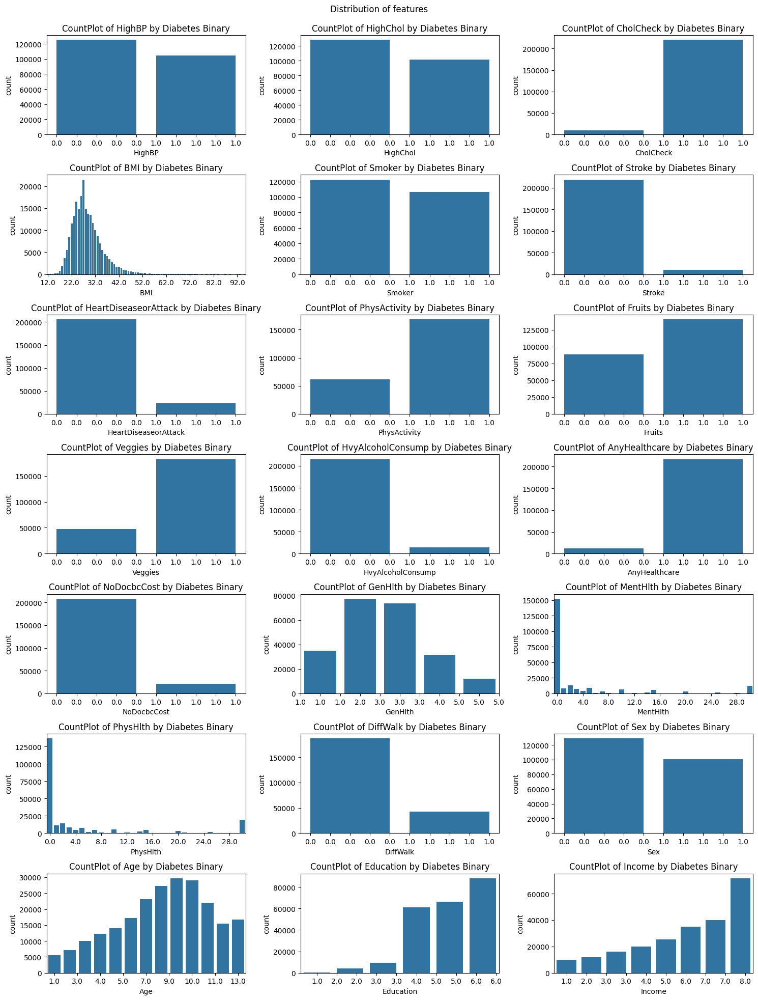

In [ ]:
fig, ax = plt.subplots(7, 3, figsize=(15, 20))
plt.suptitle('Distribution of features')
for i, col in enumerate(df.columns[1:]):
    sns.countplot(x=col, data=df, ax=ax[i // 3, i % 3])
    ax[i // 3, i % 3].set_title(f'CountPlot of {col} by Diabetes Binary')
    ax[i // 3, i % 3].xaxis.set_major_locator(plt.MaxNLocator(10))
plt.tight_layout()
plt.subplots_adjust(top=0.95) 

Видим, что большая часть признаков является категориальными, кроме BMI - индекс массы тела, MentHlth, PhysHlth - ментально и физическое здоровье.

In [ ]:
def create_plot_pivot(data2, x_column):
    """ Create a pivot table for satisfaction versus another rating for easy plotting. """
    _df_plot = data2.groupby([x_column, 'Diabetes_binary']).size() \
    .reset_index().pivot(columns='Diabetes_binary', index=x_column, values=0)
    return _df_plot

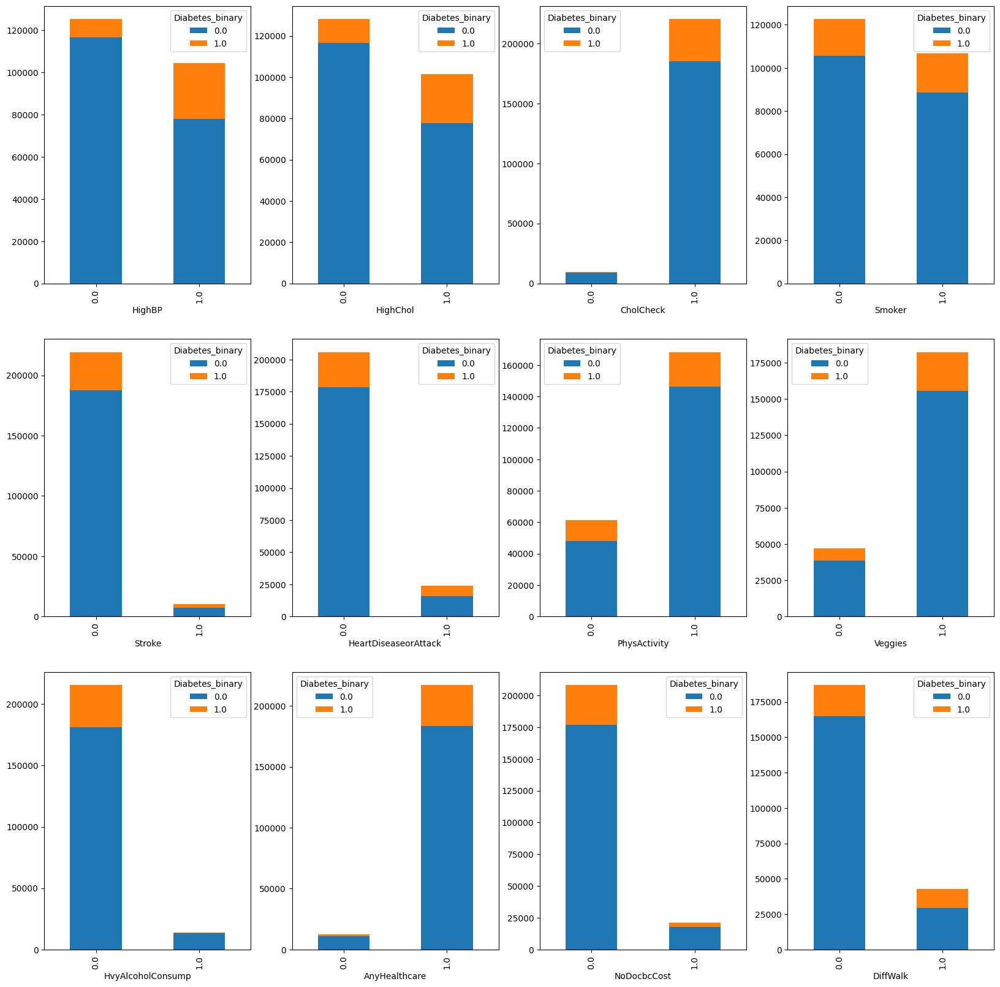

In [ ]:
cols = ['HighBP', 'HighChol', 'CholCheck','Smoker',
       'Stroke', 'HeartDiseaseorAttack', 'PhysActivity', 'Veggies',
       'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'DiffWalk']
fig, ax = plt.subplots(3, 4, figsize=(20,20))
axe = ax.ravel()

c = len(cols)

for i in range(c):
    create_plot_pivot(df, cols[i]).plot(kind='bar',stacked=True, ax=axe[i])
    axe[i].set_xlabel(cols[i])
    
plt.show()

Стало понятно, что те люди которые делали проверку холестерина в поселдение пять лет чаще имеют диабет. Люди с алкоголизмом, то у такого человека навряд ли будет диабет.

Text(0.5, 1.0, 'Correlation Heatmap')

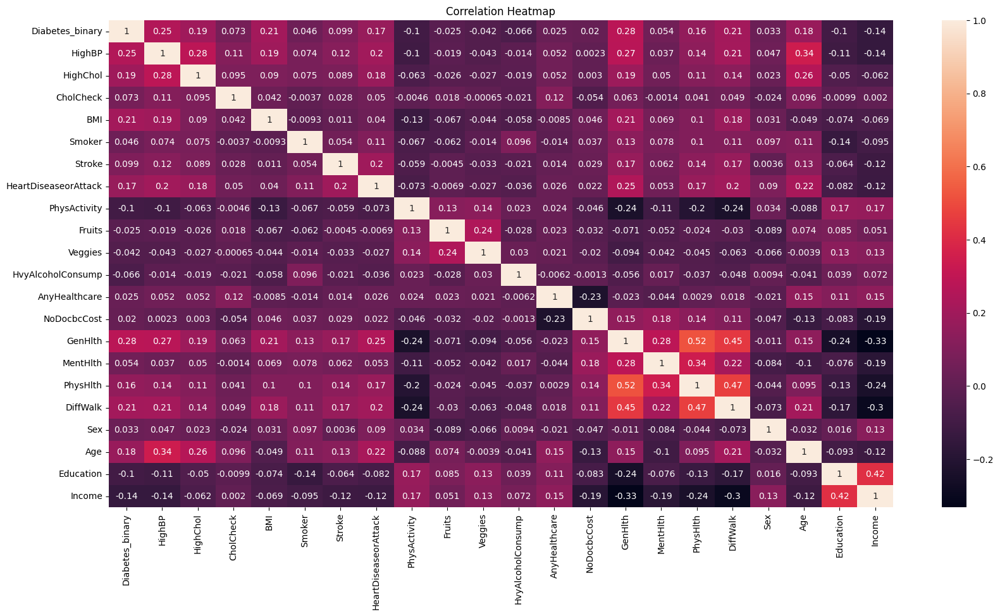

In [ ]:
plt.figure(figsize=(20, 10))
sns.heatmap(df.corr(), annot=True)
plt.title('Correlation Heatmap')

Есть какие-то линейно зависимые данные, в том числе и с таргетом. Но не достаточная зависимость, чтобы их удалить.

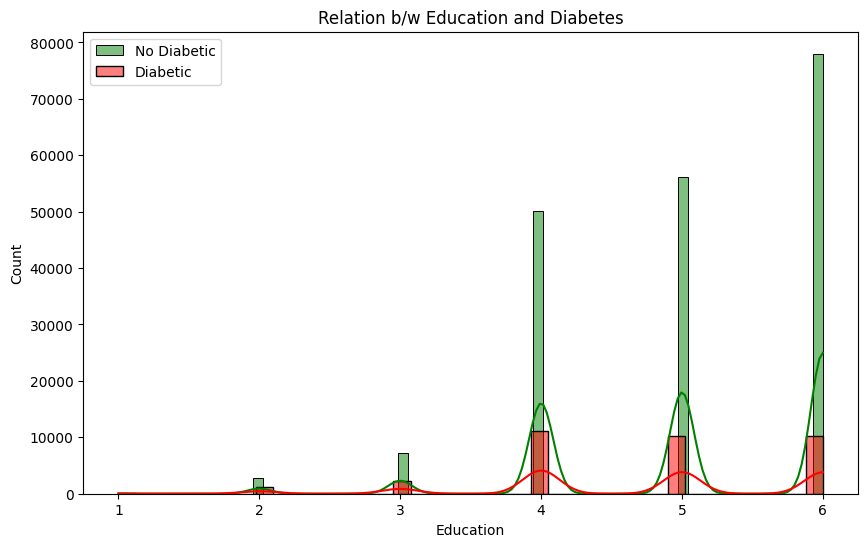

In [ ]:
plt.figure(figsize=(10,6))

sns.histplot(df.Education[df.Diabetes_binary == 0], color="g", label="No Diabetic", kde=True)
sns.histplot(df.Education[df.Diabetes_binary == 1], color="r", label="Diabetic", kde=True)
plt.title("Relation b/w Education and Diabetes")

plt.legend()
plt.show()

Видно, что среди людей чей уровент образования старшей школы диабет встречается одинаково часто.

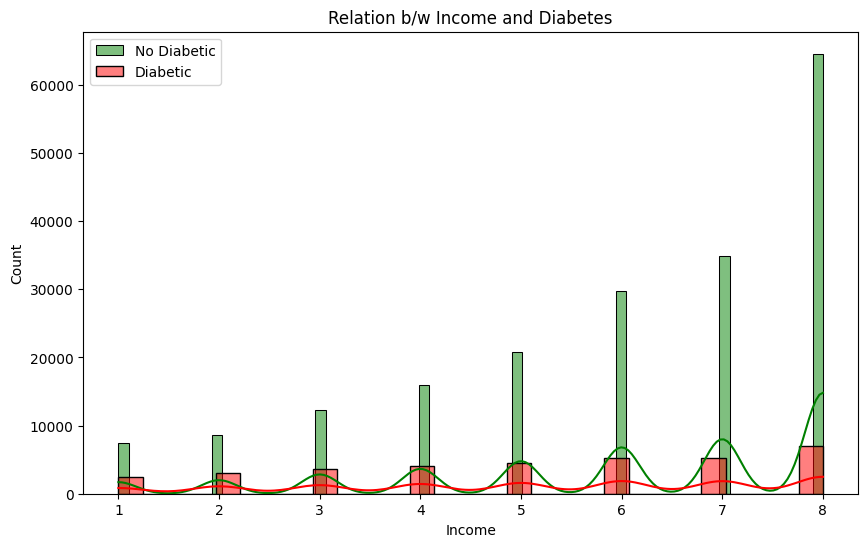

In [ ]:
plt.figure(figsize=(10,6))

sns.histplot(df.Income[df.Diabetes_binary == 0], color="g", label="No Diabetic", kde=True)
sns.histplot(df.Income[df.Diabetes_binary == 1], color="r", label="Diabetic", kde=True)
plt.title("Relation b/w Income and Diabetes")

plt.legend()
plt.show()

А вот от дохода не так сильно зависит количество людей с диабетов.

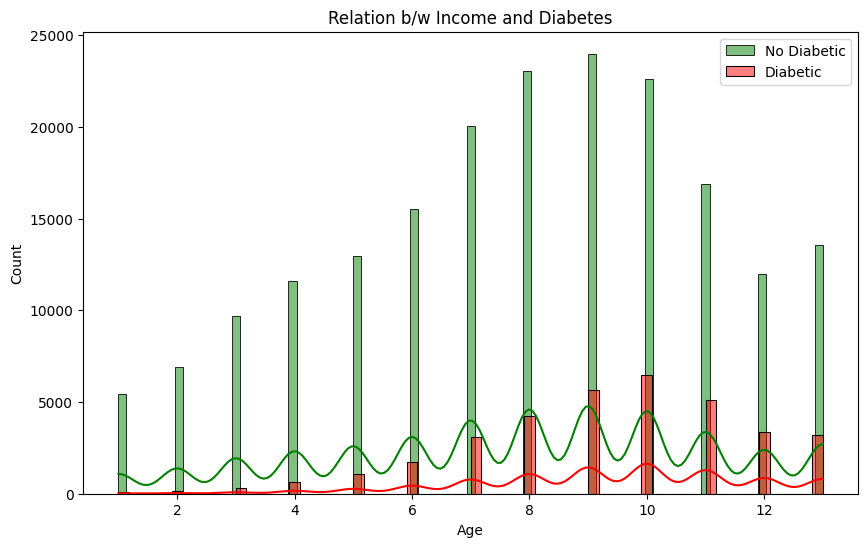

In [ ]:
plt.figure(figsize=(10,6))

sns.histplot(df.Age[df.Diabetes_binary == 0], color="g", label="No Diabetic", kde=True)
sns.histplot(df.Age[df.Diabetes_binary == 1], color="r", label="Diabetic", kde=True)
plt.title("Relation b/w Income and Diabetes")

plt.legend()
plt.show()

До 30 лет диабет встречается реже.

## Разделение и стандартизация

In [4]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
X = df.drop(columns=['Diabetes_binary'])
y = df['Diabetes_binary']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=89, stratify=y) # Очень важно использовать stratify для несбалансированных классов
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

## Снижение размерности

Попробуем снизить размерность, чтобы посмтореть разделяется ли выборка на какие-то класстеры при размерностях n = 2, 3. А также в принципе посмотрим можно ли будет снизить размерность.

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
pca = PCA()
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled) # если потом захотим построить модели на PCA-преобразованных данных

In [ ]:
X_train_scaled.shape

(160631, 21)

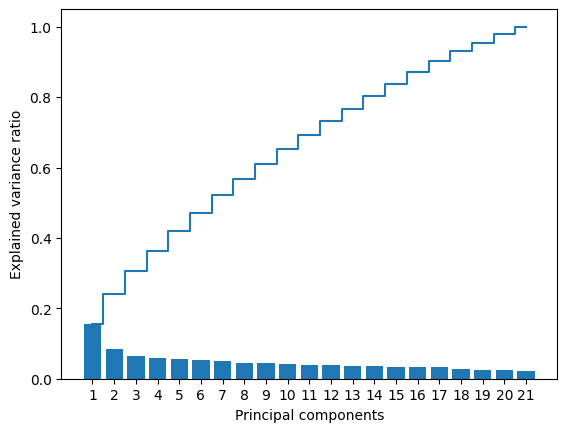

In [ ]:
plt.bar(range(1, 22), pca.explained_variance_ratio_, align='center')
plt.step(range(1, 22), np.cumsum(pca.explained_variance_ratio_), where='mid')
plt.xticks(range(1, 22))
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal components')
plt.show()

Понижение размерности с помощью PCA не дает особо хороших результатов, ну если только мы не уберем совсем чуть чуть, и признаков не так много поэтому не будем понижать.

In [ ]:
del X_train_pca, X_test_pca, pca
pca_2 = PCA(n_components=2)
pca_3 = PCA(n_components=3)

X_train_pca_2 = pca_2.fit_transform(X_train_scaled)
X_train_pca_3 = pca_3.fit_transform(X_train_scaled)

In [ ]:
pca_2_data = pd.DataFrame({"component_1" : X_train_pca_2[:, 0],
                           "component_2" : X_train_pca_2[:, 1],
                           "target" : y_train})
pca_3_data = pd.DataFrame({"component_1" : X_train_pca_3[:, 0],
                           "component_2" : X_train_pca_3[:, 1],
                           "component_3" : X_train_pca_3[:, 2],
                           "target" : y_train})

In [11]:
import plotly.express as px

In [ ]:
px.scatter(pca_2_data, x='component_1', y='component_2', color='target',
           title='PCA 2D Projection of Training Data', labels={'target': 'Diabetes Binary'})

In [68]:
px.scatter_3d(pca_3_data, color='target', x='component_1', y='component_2', z='component_3', title='Scatter for df_3_comp', width=800, height=600)

Получилось, что метод понижения размерности pca не дает качественного результата.

In [15]:
from sklearn.manifold import TSNE

indeces = np.random.choice(X_train.shape[0], size=8000, replace=False)

tsne_2 = TSNE(n_components=2, random_state=42, perplexity=25, max_iter=1000)
X_train_tsne_2 = tsne_2.fit_transform(X_train_scaled[indeces])

tsne_3 = TSNE(n_components=3, random_state=42, perplexity=25, max_iter=1000)
X_train_tsne_3 = tsne_3.fit_transform(X_train_scaled[indeces])

In [16]:
tsne_2_data = pd.DataFrame({"component_1" : X_train_tsne_2[:, 0],
                           "component_2" : X_train_tsne_2[:, 1],
                           "target" : y_train.iloc[indeces]})

tsne_3_data = pd.DataFrame({"component_1" : X_train_tsne_3[:, 0],
                           "component_2" : X_train_tsne_3[:, 1],
                           "component_3" : X_train_tsne_3[:, 2],
                           "target" : y_train.iloc[indeces]})

In [17]:
px.scatter(tsne_2_data, x='component_1', y='component_2', color='target',
           title='PCA 2D Projection of Training Data', labels={'target': 'Diabetes Binary'})

In [13]:
px.scatter_3d(tsne_3_data, color='target', x='component_1', y='component_2', z='component_3', title='Scatter for df_3_comp', width=800, height=600)

NameError: name 'pca_3_data' is not defined

Этот метод тоже дал неудовлетворительные результаты, поэтому запускать его на всей выборке и использовать в дальнейших моделях, нет смылса

# Модели

In [21]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, precision_recall_curve, roc_curve
from sklearn.model_selection import cross_val_score
from sklearn.metrics import make_scorer, fbeta_score

In [35]:
# Будем проводить кросс-валидацию по метрике fbeta_score с beta=2, что означает, что мы будем больше акцентироваться на recall, чем на precision
fbeta = make_scorer(fbeta_score, beta=2, average='binary')

In [36]:
def print_metrics(y_true, y_pred, y_proba):
    print(f'Accuracy: {accuracy_score(y_true, y_pred):.4f}')
    print(f'Precision: {precision_score(y_true, y_pred):.4f}')
    print(f'Recall: {recall_score(y_true, y_pred):.4f}')
    print(f'F-beta Score: {fbeta_score(y_true, y_pred, beta=2, average='binary'):.4f}')
    print(f'ROC AUC: {roc_auc_score(y_true, y_proba):.4f}')

def plot_confusion_matrix(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No Diabetes', 'Diabetes'], yticklabels=['No Diabetes', 'Diabetes'])
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')
    plt.show()

def plot_roc_curve(y_true, y_proba):
    fpr, tpr, thresholds = roc_curve(y_true, y_proba)
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, label='ROC Curve')
    plt.plot([0, 1], [0, 1], 'k--', label='Random Guessing')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend()
    plt.show()

def plot_precision_recall_curve(y_true, y_proba):
    precision, recall, thresholds = precision_recall_curve(y_true, y_proba)
    plt.figure(figsize=(8, 6))
    plt.plot(recall, precision, label='Precision-Recall Curve')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.legend()
    plt.show()
    
def all_metrics(y_true, y_pred, y_proba):
    print_metrics(y_true, y_pred, y_proba)
    plot_confusion_matrix(y_true, y_pred)
    plot_precision_recall_curve(y_true, y_proba)
    plot_roc_curve(y_true, y_proba)

## KNN

Подберем параметр k в KNN. При кросс-валиданции будем ориентироваться на метрику f-beta, в которой отдано предпочтение recall. И посмотрим на разные метрики.

In [38]:
from sklearn.neighbors import KNeighborsClassifier

best_score = float('inf')
best_k = None

for k in range(3, 100, 10):
    knn = KNeighborsClassifier(n_neighbors=k, n_jobs=-1)
    knn.fit(X_train_scaled, y_train)
    scores = cross_val_score(knn, X_train_scaled, y_train, cv=3, scoring=fbeta)
    mean_score = np.mean(scores)
    if mean_score < best_score or best_k is None:
        best_score = mean_score
        best_k = k

In [39]:
print(f"Лучшее значение k: {best_k}, лучшее значение ошибки: {best_score}")

Лучшее значение k: 93, лучшее значение ошибки: 0.07515049073434964


In [40]:
knn = KNeighborsClassifier(n_neighbors=best_k, n_jobs=-1)
knn.fit(X_train_scaled, y_train)
print_metrics(y_train, knn.predict(X_train_scaled), knn.predict_proba(X_train_scaled)[:, 1])

Accuracy: 0.8650
Precision: 0.6318
Recall: 0.0747
F-beta Score: 0.0907
ROC AUC: 0.8270


In [41]:
print_metrics(y_test, knn.predict(X_test_scaled), knn.predict_proba(X_test_scaled)[:, 1])

Accuracy: 0.8647
Precision: 0.6213
Recall: 0.0749
F-beta Score: 0.0909
ROC AUC: 0.8166


## Линейные модели

In [42]:
from sklearn.linear_model import LogisticRegression

log_reg = LogisticRegression(max_iter=1000, random_state=42)
log_reg.fit(X_train_scaled, y_train)
y_pred = log_reg.predict(X_test_scaled)

In [43]:
print_metrics(y_train, log_reg.predict(X_train_scaled), log_reg.predict_proba(X_train_scaled)[:, 1])

Accuracy: 0.8633
Precision: 0.5327
Recall: 0.1511
F-beta Score: 0.1763
ROC AUC: 0.8205


In [45]:
print_metrics(y_test, log_reg.predict(X_test_scaled), log_reg.predict_proba(X_test_scaled)[:, 1])

Accuracy: 0.8642
Precision: 0.5433
Recall: 0.1587
F-beta Score: 0.1849
ROC AUC: 0.8257
